# Imports and utilities

In [14]:
# !pip install stable-baselines3==1.7.0
# !pip install joblib
# !pip install scikit-learn
# !pip install tqdm
# !pip install matplotlib
# !pip install gymnasium
import os
import tensorflow as tf
from tensorflow import keras
os.environ['MUJOCO_GL'] = 'glfw'

In [16]:
# imports for SAR
from SAR_tutorial_utils import *

# SAR core functions

<div style="display: flex; align-items: flex-start;">
    <div style="flex: 1;">
         Next, implement for SAR step by step. The framework follows the basic structure displayed below. Accordingly, we will implement functions that do each of the following:
        <br>
        <br>
        <ol>
            <li>玩耍阶段训练</li>
            <li>捕捉玩耍阶段肌肉激活数据</li>
            <li>使用肌肉激活数据计算SAR</li>
            <li>使用计算后的SAR训练目标数据</li>
        </ol>
        <br>
        As we implement each of the above, we will also go into more detail about best practices for that step.
        <br>
    </div>
</div>

<div style="width:100%;">
    <img src="./SAR_images/framework.png" alt="SAR framework" style="width:1200px; display:block; margin-left:auto; margin-right:auto;"/>
</div>

### Step 1: Train a play phase policy

In [25]:
from stable_baselines3.common.callbacks import CheckpointCallback
def train(env_name, policy_name, timesteps, seed, checkpoint_freq=50000, continue_from=None):
    # 定义一个带有检查点功能的训练函数，使用 Stable-Baselines3 的 SAC 算法训练策略。
    # 参数说明：
    # - env_name: 环境名称（字符串）。
    # - policy_name: 策略的唯一标识符（字符串）。
    # - timesteps: 训练的总时间步数（整数）。
    # - seed: 用于区分多个相同参数训练的策略（字符串）。
    # - checkpoint_freq: 保存检查点的频率（以时间步为单位）。
    # - continue_from: 可选参数，继续训练的检查点路径。

    env = gym.make(env_name)
    # 创建一个 Gym 环境实例。

    env = Monitor(env)
    # 使用 Monitor 包装环境以记录训练过程中的统计信息。

    env = DummyVecEnv([lambda: env])
    # 使用 DummyVecEnv 将环境包装为向量化环境，以便与 Stable-Baselines3 兼容。

    env = VecNormalize(env, norm_obs=True, norm_reward=False, clip_obs=10.)
    # 使用 VecNormalize 对环境进行归一化处理：
    # - norm_obs=True: 归一化观察值。
    # - norm_reward=False: 不归一化奖励。
    # - clip_obs=10.: 将观察值裁剪到 [-10, 10] 范围。

    net_shape = [400, 300]
    # 定义神经网络的架构，包含两层，分别有 400 和 300 个神经元。

    policy_kwargs = dict(net_arch=dict(pi=net_shape, qf=net_shape))
    # 定义策略网络的参数：
    # - pi: 策略网络的架构。
    # - qf: Q 函数网络的架构。
    
    # 创建检查点回调函数
    checkpoint_callback = CheckpointCallback(
        save_freq=checkpoint_freq,
        save_path=f'./checkpoints/{policy_name}_{env_name}_{seed}/',
        name_prefix='sac_model',
        save_replay_buffer=True,
        save_vecnormalize=True,
    )
    # 设置检查点回调函数：
    # - save_freq: 保存频率（以时间步为单位）
    # - save_path: 保存路径
    # - name_prefix: 文件名前缀
    # - save_replay_buffer: 是否保存回放缓冲区
    # - save_vecnormalize: 是否保存向量环境的归一化状态
    
    # 确保检查点目录存在
    import os
    os.makedirs(f'./checkpoints/{policy_name}_{env_name}_{seed}/', exist_ok=True)

    # 如果提供了继续训练的检查点路径，则从检查点加载模型
    if continue_from:
        print(f"Continuing training from checkpoint: {continue_from}")
        model = SAC.load(
            continue_from,
            env=env,
            custom_objects={
                "learning_rate": linear_schedule(.001),
                "buffer_size": int(3e5),
                "learning_starts": 1000,
                "batch_size": 256,
                "tau": .02,
                "gamma": .98,
                "train_freq": (1, "episode"),
                "gradient_steps": -1,
                "policy_kwargs": policy_kwargs
            }
        )
        
        # 加载回放缓冲区（如果存在）
        replay_buffer_path = continue_from.replace("sac_model_", "sac_model_replay_buffer_")
        if os.path.exists(replay_buffer_path):
            model.load_replay_buffer(replay_buffer_path)
            print(f"Loaded replay buffer from {replay_buffer_path}")
        
        # 尝试加载 VecNormalize 状态（如果存在）
        vecnormalize_path = continue_from.replace("sac_model_", "sac_model_vecnormalize_")
        if os.path.exists(vecnormalize_path):
            env = VecNormalize.load(vecnormalize_path, env)
            print(f"Loaded VecNormalize state from {vecnormalize_path}")
            # 这一步很重要：确保环境继续更新标准化统计数据
            env.training = True
            env.norm_reward = False
    else:
        # 如果没有继续训练，则创建新模型
        model = SAC('MlpPolicy', env, learning_rate=linear_schedule(.001), buffer_size=int(3e5),
                learning_starts=1000, batch_size=256, tau=.02, gamma=.98, train_freq=(1, "episode"),
                gradient_steps=-1, policy_kwargs=policy_kwargs, verbose=1)

    succ_callback = SaveSuccesses(check_freq=1, env_name=env_name+'_'+seed, 
                             log_dir=f'{policy_name}_successes_{env_name}_{seed}')
    # 创建一个回调函数 SaveSuccesses，用于保存训练成功的统计信息。

    model.set_logger(configure(f'{policy_name}_results_{env_name}_{seed}'))
    # 配置模型的日志记录器，日志将保存到指定目录。

    # 组合多个回调函数
    callbacks = [succ_callback, checkpoint_callback]

    model.learn(total_timesteps=int(timesteps), callback=callbacks, log_interval=4)
    # 开始训练模型，使用组合的回调函数。

    model.save(f"{policy_name}_model_{env_name}_{seed}")
    # 保存训练好的最终模型到文件。

    env.save(f'{policy_name}_env_{env_name}_{seed}')
    # 保存归一化环境的最终状态到文件。
    
    print(f"Training completed! Final model saved as {policy_name}_model_{env_name}_{seed}")
    
    return model, env

### Step 2: Roll out play phase policy to capture muscle activations over time

`get_activations()` extracts muscle activation data at each timestep of the trained play phase policy's rollouts. In this implementation, `get_activations()` captures muscle activations from a given rollout if the rewards from that rollout fall above a certain threshold, computed as a percentile from a set of preview rollouts. 

Here, we set the number of sample episodes to 2000 and the reward percentile cutoff at 80%, though these should be considered hyperparameters that may require finetuning for a specific use case.

In [26]:
def get_activations_vae(name, env_name, seed, encoder, decoder, normalizer, episodes=2000, percentile=80):
    """
    从使用 VAE 训练的策略中获取肌肉激活数据
    
    name: str; 策略名称
    env_name: str; 环境名称
    seed: str; 种子值
    encoder: VAE编码器模型
    decoder: VAE解码器模型
    normalizer: 归一化器对象
    episodes: int; 运行回合数
    percentile: int; 奖励阈值百分位数
    """

    with gym.make(env_name) as env:
        env.reset()
        # 创建一个 Gym 环境实例，并在上下文管理器中使用，确保资源释放。
        # 调用 `reset()` 方法初始化环境。

        model = SAC.load(f'{name}_model_{env_name}_{seed}')
        # 加载训练好的 SAC 模型，文件名由策略名称、环境名称和种子组成。

        vec = VecNormalize.load(f'{name}_env_{env_name}_{seed}', DummyVecEnv([lambda: env]))
        # 加载归一化环境的状态，并将其包装为 DummyVecEnv 以与模型兼容。

        # Calculate the reward threshold from 100 preview episodes
        preview_rewards = []
        # 初始化一个列表，用于存储预览回合的奖励。

        for _ in range(100):
            env.reset()
            # 重置环境。

            rewards = 0
            # 初始化奖励计数器。

            done = False
            # 初始化回合结束标志。

            while not done:
                o = env.get_obs()
                # 获取当前观察值。

                o = vec.normalize_obs(o)
                # 对观察值进行归一化处理。

                a, __ = model.predict(o, deterministic=False)
                # 使用模型预测动作，`deterministic=False` 表示使用随机策略。

                next_o, r, done, *_, info = env.step(a)
                # 执行动作，获取下一步的观察值、奖励、回合结束标志和其他信息。

                rewards += r
                # 累加奖励。

            preview_rewards.append(rewards)
            # 将当前回合的总奖励添加到预览奖励列表中。

        reward_threshold = np.percentile(preview_rewards, percentile)
        # 根据预览奖励列表计算奖励阈值，使用指定的百分位数。

        solved_acts = []
        # 初始化一个列表，用于存储成功回合的激活数据。

        for _ in tqdm(range(episodes)):
            env.reset()
            # 重置环境。

            rewards, acts = 0, []
            # 初始化奖励计数器和动作列表。

            done = False
            # 初始化回合结束标志。

            while not done:
                o = env.get_obs()
                # 获取当前观察值。

                o = vec.normalize_obs(o)
                # 对观察值进行归一化处理。

                a, __ = model.predict(o, deterministic=False)
                # 使用模型预测动作，`deterministic=False` 表示使用随机策略。

                next_o, r, done, *_, info = env.step(a)
                # 执行动作，获取下一步的观察值、奖励、回合结束标志和其他信息。

                acts.append(env.sim.data.act.copy())
                # 将当前的肌肉激活数据复制并添加到动作列表中。

                rewards += r
                # 累加奖励。

            if rewards > reward_threshold:
                solved_acts.extend(acts)
                # 如果当前回合的总奖励超过奖励阈值，将动作列表添加到成功回合的激活数据中。

    return np.array(solved_acts)
    # 将成功回合的激活数据转换为 NumPy 数组并返回。

### Step 3: Compute SAR from the activation dataset

We use linear representations (i.e., PCA, ICA, normalization) to approximate SAR. These representations are based directly on the motor neuroscience literature of representing muscle synergies (c.f., [Tresch et al, 2006](https://journals.physiology.org/doi/epdf/10.1152/jn.00222.2005)). Such representations also have the advantages of being highly interpretable and efficient for use as control signals. We also found in practice that nonlinear representations (such as VAE decoder networks) did not lead to strong performance are were far less efficient for training.

Before computing SAR, we first seek to understand how informative each individual muscle synergy is for explaining the initial muscle activation dataset. `find_synergies` returns a dictionary (and optionally, a plot) that shows variance accounted for (VAF) by N synergies from the original muscle activation data. In general, we find that using a number of synergies where VAF > 80% leads to good performance, though this value should be treated as a hyperparameter.

In [27]:
def find_synergies_vae(acts, latent_dims_list, epochs=50, batch_size=128, plot=True):
    """
    计算使用不同维度的 VAE 模型解释的原始肌肉激活数据方差百分比
    
    acts: np.array; 包含肌肉激活数据的数组
    latent_dims_list: list; 要测试的潜在空间维度列表 
    epochs: int; 训练轮数
    batch_size: int; 批量大小
    plot: bool; 是否绘制结果
    """
    import tensorflow as tf
    from tensorflow import keras
    from tensorflow.keras import layers
    
    # 输入维度（肌肉数量）
    input_dim = acts.shape[1]
    
    # 存储不同维度的重构误差
    reconstruction_errors = {}
    
    for latent_dim in latent_dims_list:
        # 创建 VAE 模型
        # 编码器
        encoder_inputs = keras.Input(shape=(input_dim,))
        x = layers.Dense(128, activation="relu")(encoder_inputs)
        x = layers.Dense(64, activation="relu")(x)
        
        z_mean = layers.Dense(latent_dim)(x)
        z_log_var = layers.Dense(latent_dim)(x)
        
        def sampling(args):
            z_mean, z_log_var = args
            batch = tf.shape(z_mean)[0]
            dim = tf.shape(z_mean)[1]
            epsilon = tf.random.normal(shape=(batch, dim))
            return z_mean + tf.exp(0.5 * z_log_var) * epsilon
        
        z = layers.Lambda(sampling)([z_mean, z_log_var])
        
        encoder = keras.Model(encoder_inputs, [z_mean, z_log_var, z])
        
        # 解码器
        latent_inputs = keras.Input(shape=(latent_dim,))
        x = layers.Dense(64, activation="relu")(latent_inputs)
        x = layers.Dense(128, activation="relu")(x)
        decoder_outputs = layers.Dense(input_dim, activation="sigmoid")(x)
        
        decoder = keras.Model(latent_inputs, decoder_outputs)
        
        # VAE 模型
        outputs = decoder(encoder(encoder_inputs)[2])
        vae = keras.Model(encoder_inputs, outputs)
        
        # 添加损失
        reconstruction_loss = keras.losses.mean_squared_error(encoder_inputs, outputs)
        reconstruction_loss *= input_dim
        kl_loss = -0.5 * tf.reduce_mean(1 + z_log_var - tf.square(z_mean) - tf.exp(z_log_var))
        vae_loss = reconstruction_loss + kl_loss
        
        vae.add_loss(vae_loss)
        vae.compile(optimizer="adam")
        
        # 训练模型
        vae.fit(acts, acts, epochs=epochs, batch_size=batch_size, verbose=0)
        
        # 评估重构误差
        reconstructed = vae.predict(acts)
        mse = np.mean(np.square(acts - reconstructed))
        total_variance = np.var(acts)
        explained_variance = 1 - (mse / total_variance)
        
        reconstruction_errors[latent_dim] = round(explained_variance, 4)
    
    if plot:
        plt.plot(list(reconstruction_errors.keys()), list(reconstruction_errors.values()))
        plt.title('VAF by N VAE latent dimensions')
        plt.xlabel('# latent dimensions')
        plt.ylabel('VAF')
        plt.grid()
        plt.show()
    
    return reconstruction_errors

Once the number of synergies to use is determined (above), `compute_SAR()` will take the activation data as input and yield the synergistic action representation (SAR) in the form of ICA, PCA, and normalizer objects.

In [28]:
def create_VAE(acts, latent_dim, epochs=50, batch_size=128, save=False):
    """
    创建并训练 VAE 模型用于肌肉激活数据的降维
    
    acts: np.array; 肌肉激活数据
    latent_dim: int; 潜在空间维度（替代PCA的主成分数量）
    epochs: int; 训练轮数
    batch_size: int; 批量大小
    save: bool; 是否保存模型
    """
    
    # 输入维度（肌肉数量）
    input_dim = acts.shape[1]
    
    # 编码器
    encoder_inputs = keras.Input(shape=(input_dim,))
    x = layers.Dense(128, activation="relu")(encoder_inputs)
    x = layers.Dense(64, activation="relu")(x)
    
    # VAE 特有部分 - 均值和对数方差
    z_mean = layers.Dense(latent_dim)(x)
    z_log_var = layers.Dense(latent_dim)(x)
    
    # 采样层
    def sampling(args):
        z_mean, z_log_var = args
        batch = tf.shape(z_mean)[0]
        dim = tf.shape(z_mean)[1]
        epsilon = tf.random.normal(shape=(batch, dim))
        return z_mean + tf.exp(0.5 * z_log_var) * epsilon
    
    z = layers.Lambda(sampling)([z_mean, z_log_var])
    
    # 定义编码器模型
    encoder = keras.Model(encoder_inputs, [z_mean, z_log_var, z], name="encoder")
    
    # 解码器
    latent_inputs = keras.Input(shape=(latent_dim,))
    x = layers.Dense(64, activation="relu")(latent_inputs)
    x = layers.Dense(128, activation="relu")(x)
    decoder_outputs = layers.Dense(input_dim, activation="sigmoid")(x)
    
    # 定义解码器模型
    decoder = keras.Model(latent_inputs, decoder_outputs, name="decoder")
    
    # VAE 模型
    outputs = decoder(encoder(encoder_inputs)[2])
    vae = keras.Model(encoder_inputs, outputs, name="vae")
    
    # 添加 KL 散度损失
    reconstruction_loss = keras.losses.mean_squared_error(encoder_inputs, outputs)
    reconstruction_loss *= input_dim
    kl_loss = -0.5 * tf.reduce_mean(1 + z_log_var - tf.square(z_mean) - tf.exp(z_log_var))
    vae_loss = reconstruction_loss + kl_loss
    
    vae.add_loss(vae_loss)
    vae.compile(optimizer="adam")
    
    # 训练模型
    vae.fit(acts, acts, epochs=epochs, batch_size=batch_size, verbose=1)
    
    if save:
        encoder.save('vae_encoder_demo.h5')
        decoder.save('vae_decoder_demo.h5')
    
    return encoder, decoder

In [29]:
def compute_VAE_SAR(acts, latent_dim, save=False):
    """
    使用 VAE 计算肌肉激活数据的协同作用
    
    acts: np.array; 包含肌肉激活数据的 NumPy 数组
    latent_dim: int; 潜在空间维度（协同作用数量）
    save: bool; 是否保存结果模型到磁盘
    """
    # 创建并训练 VAE 模型
    encoder, decoder = create_VAE(acts, latent_dim, save=save)
    
    # 创建归一化器（可选，VAE 输出通常已经归一化）
    normalizer = MinMaxScaler((-1, 1))
    
    # 获取潜在空间表示用于拟合归一化器
    _, _, latent_repr = encoder.predict(acts)
    normalizer.fit(latent_repr)
    
    if save:
        joblib.dump(normalizer, 'scaler_vae_demo.pkl')
    
    return encoder, decoder, normalizer

### Step 4: Use computed SAR to train on target task

In order to train with SAR, we initialize a `SynNoSynWrapper`, which implements the policy architecture presented below. 

The policy takes as input $o_t$ and outputs an $O+N$-dimensional action vector, $a_{t}^{O+N}$, where $O$ is the dimensionality of the original action manifold and $N$ is the dimensionality of the synergistic manifold. The first $N$ synergistic actions are passed through $SAR(a_{t}^{N})=a_{t}^{SAR}$ to recover the synergistic muscle activations. The subsequent $O$ task-specific activations are mixed with the task-general activations using a linear blend $\varphi$ to recover the final action $a_t^*$ that steps the environment forward. Note that for the locomotion experiments presented next, it was actually found that purely relying on the synergistic, task-general pathway ($\varphi=1$) was sufficient for learning robust locomotion (see end-to-end example later in the notebook).

<div style="width:100%;">
    <img src="./SAR_images/pol_arch.png" alt="Policy Architecture" style="width:850px; display:block; margin-left:auto; margin-right:auto;"/>
</div>

In [30]:
class VAESynNoSynWrapper(gym.ActionWrapper):
    """
    使用 VAE 创建混合动作空间，包含潜在空间和原始空间
    """
    
    def __init__(self, env, encoder, decoder, normalizer, phi):
        super().__init__(env)
        
        self.encoder = encoder
        self.decoder = decoder
        self.normalizer = normalizer
        self.weight = phi
        
        # 获取潜在空间维度
        self.syn_act_space = encoder.output[0].shape[1]  # 使用第一个输出(z_mean)的形状
        self.no_syn_act_space = env.action_space.shape[0]
        self.full_act_space = self.syn_act_space + self.no_syn_act_space
        
        # 定义新的混合动作空间
        self.action_space = gym.spaces.Box(low=-1., high=1., shape=(self.full_act_space,), dtype=np.float32)
    
    def action(self, act):
        # 分离协同作用部分和非协同作用部分
        syn_action = act[:self.syn_act_space]
        no_syn_action = act[self.syn_act_space:]
        
        # 将协同作用部分从归一化潜在空间转换到标准潜在空间
        normalized_syn_action = self.normalizer.inverse_transform([syn_action])[0]
        
        # 使用解码器将潜在表示转换回原始动作空间
        syn_action_original = self.decoder.predict(np.array([normalized_syn_action]), verbose=0)[0]
        
        # 混合两种动作
        final_action = self.weight * syn_action_original + (1 - self.weight) * no_syn_action
        
        return final_action

Additionally, we initialize a `SynergyWrapper`, which implements a variation of the above policy architecture that only leverages task-general synergistic activations (i.e., a more efficient implementation for handling the case where $\varphi=1$).

In [31]:
class VAESynergyWrapper(gym.ActionWrapper):
    """
    使用 VAE 将动作空间重新定义为潜在空间并将其逆变换回原始肌肉激活空间
    """
    
    def __init__(self, env, encoder, decoder, normalizer):
        super().__init__(env)
        
        self.encoder = encoder
        self.decoder = decoder
        self.normalizer = normalizer
        
        # 获取潜在空间维度
        latent_dim = encoder.output[0].shape[1]  # 使用第一个输出(z_mean)的形状
        
        # 定义新的动作空间
        self.action_space = gym.spaces.Box(low=-1., high=1., shape=(latent_dim,), dtype=np.float32)
    
    def action(self, act):
        # 从归一化潜在空间转到标准潜在空间
        normalized_act = self.normalizer.inverse_transform([act])[0]
        
        # 使用解码器将潜在表示转换回原始动作空间
        action = self.decoder.predict(np.array([normalized_act]), verbose=0)[0]
        
        return action

We proceed to train a policy with this architecture using `SAR_RL`. We find that a blend weight $\varphi$=0.66 between the synergistic (task-general) and nonsynergistic (task-specific) activations works best in practice, though this should also be considered a hyperparameter that may require optimization for specific use cases.

In [32]:
def VAE_RL(env_name, policy_name, timesteps, seed, encoder, decoder, normalizer, phi=.66, syn_nosyn=True):
    """
    使用 VAE 降维训练策略
    
    env_name: str; 环境名称
    policy_name: str; 策略标识符
    timesteps: int; 训练时间步数
    seed: str; 训练的种子值
    encoder: VAE编码器模型
    decoder: VAE解码器模型
    normalizer: 归一化器对象
    phi: float; 混合参数
    syn_nosyn: bool; 是否使用混合模式
    """
    if syn_nosyn:
        env = VAESynNoSynWrapper(gym.make(env_name), encoder, decoder, normalizer, phi)
        # 如果 `syn_nosyn` 为 True，则使用 VAESynNoSynWrapper 包装环境。
    else:
        env = VAESynergyWrapper(gym.make(env_name), encoder, decoder, normalizer)
        # 如果 `syn_nosyn` 为 False，则使用 VAESynergyWrapper 包装环境。

    env = Monitor(env)
    # 使用 Monitor 包装环境以记录训练过程中的统计信息。

    env = DummyVecEnv([lambda: env])
    # 使用 DummyVecEnv 将环境包装为向量化环境，以便与 Stable-Baselines3 兼容。

    env = VecNormalize(env, norm_obs=True, norm_reward=False, clip_obs=10.)
    # 使用 VecNormalize 对环境进行归一化处理：
    # - norm_obs=True: 归一化观察值。
    # - norm_reward=False: 不归一化奖励。
    # - clip_obs=10.: 将观察值裁剪到 [-10, 10] 范围。

    net_shape = [400, 300]
    # 定义神经网络的架构，包含两层，分别有 400 和 300 个神经元。

    policy_kwargs = dict(net_arch=dict(pi=net_shape, qf=net_shape))
    # 定义策略网络的参数：
    # - pi: 策略网络的架构。
    # - qf: Q 函数网络的架构。

    model = SAC('MlpPolicy', env, learning_rate=linear_schedule(.001), buffer_size=int(3e5),
            learning_starts=5000, batch_size=256, tau=.02, gamma=.98, train_freq=(1, "episode"),
            gradient_steps=-1,policy_kwargs=policy_kwargs, verbose=1)
    # 创建一个 SAC 模型实例：
    # - 'MlpPolicy': 使用多层感知机策略。
    # - env: 使用的环境。
    # - learning_rate: 学习率，使用线性调度函数。
    # - buffer_size: 经验回放缓冲区大小。
    # - learning_starts: 开始训练前的时间步数。
    # - batch_size: 批量大小。
    # - tau: 目标网络软更新系数。
    # - gamma: 折扣因子。
    # - train_freq: 训练频率（每个 episode 训练一次）。
    # - gradient_steps: 每次更新的梯度步数（-1 表示每次更新与 train_freq 相同）。
    # - policy_kwargs: 策略网络的参数。
    # - verbose: 日志输出级别。

    succ_callback = SaveSuccesses(check_freq=1, env_name=env_name+'_'+seed, 
                             log_dir=f'{policy_name}_successes_{env_name}_{seed}')
    # 创建一个回调函数 SaveSuccesses，用于保存训练成功的统计信息：
    # - check_freq: 检查频率（每 1 个时间步检查一次）。
    # - env_name: 保存成功统计信息的环境名称。
    # - log_dir: 保存日志的目录。

    model.set_logger(configure(f'{policy_name}_results_{env_name}_{seed}'))
    # 配置模型的日志记录器，日志将保存到指定目录。

    model.learn(total_timesteps=int(timesteps), callback=succ_callback, log_interval=4)
    # 开始训练模型：
    # - total_timesteps: 总训练时间步数。
    # - callback: 使用 SaveSuccesses 回调函数。
    # - log_interval: 日志记录间隔。

    model.save(f"{policy_name}_model_{env_name}_{seed}")
    # 保存训练好的模型到文件。

    env.save(f'{policy_name}_env_{env_name}_{seed}')
    # 保存归一化环境的状态到文件。

# 创建模型保存和加载函数

In [ ]:
def save_vae_models(encoder, decoder, normalizer, name="vae_demo"):
    """
    保存 VAE 模型及归一化器
    
    encoder: 编码器模型
    decoder: 解码器模型
    normalizer: 归一化器
    name: 保存名称前缀
    """
    encoder.save(f'{name}_encoder.h5')
    decoder.save(f'{name}_decoder.h5')
    joblib.dump(normalizer, f'{name}_scaler.pkl')
    
def load_vae_models(name="vae_demo"):
    """
    加载 VAE 模型及归一化器
    
    name: 加载名称前缀
    """
    import tensorflow as tf
    
    encoder = tf.keras.models.load_model(f'{name}_encoder.h5')
    decoder = tf.keras.models.load_model(f'{name}_decoder.h5')
    normalizer = joblib.load(f'{name}_scaler.pkl')
    
    return encoder, decoder, normalizer

# 创建测试和可视化函数

In [ ]:
def visualize_vae_synergies(acts, encoder, decoder, n_examples=5):
    """
    可视化 VAE 协同作用的效果
    
    acts: 肌肉激活数据
    encoder: 编码器模型
    decoder: 解码器模型
    n_examples: 要展示的样本数量
    """
    # 随机选择一些样本
    indices = np.random.choice(len(acts), n_examples, replace=False)
    samples = acts[indices]
    
    # 获取潜在表示
    z_mean, z_log_var, z = encoder.predict(samples)
    
    # 重构样本
    reconstructed = decoder.predict(z)
    
    # 可视化原始样本和重构样本
    plt.figure(figsize=(12, 6))
    for i in range(n_examples):
        # 原始样本
        plt.subplot(2, n_examples, i + 1)
        plt.bar(range(len(samples[i])), samples[i])
        plt.title(f"Original {i+1}")
        plt.ylim(0, 1)
        
        # 重构样本
        plt.subplot(2, n_examples, i + 1 + n_examples)
        plt.bar(range(len(reconstructed[i])), reconstructed[i])
        plt.title(f"Reconstructed {i+1}")
        plt.ylim(0, 1)
    
    plt.tight_layout()
    plt.show()
    
def test_vae_performance(env_name, original_model_name, vae_model_name, seed, encoder, decoder, normalizer, n_episodes=10):
    """
    比较原始模型和使用 VAE 训练的模型的性能
    
    env_name: 环境名称
    original_model_name: 原始策略名称
    vae_model_name: VAE策略名称
    seed: 种子值
    encoder, decoder, normalizer: VAE模型组件
    n_episodes: 测试回合数
    """
    env = gym.make(env_name)
    
    # 加载原始模型
    original_model = SAC.load(f'{original_model_name}_model_{env_name}_{seed}')
    original_env = VecNormalize.load(f'{original_model_name}_env_{env_name}_{seed}', 
                                    DummyVecEnv([lambda: env]))
    
    # 加载VAE模型
    vae_model = SAC.load(f'{vae_model_name}_model_{env_name}_{seed}')
    vae_env = VecNormalize.load(f'{vae_model_name}_env_{env_name}_{seed}', 
                               DummyVecEnv([lambda: VAESynergyWrapper(env, encoder, decoder, normalizer)]))
    
    # 收集性能指标
    original_rewards = []
    vae_rewards = []
    
    # 测试原始模型
    for _ in range(n_episodes):
        env.reset()
        done = False
        episode_reward = 0
        
        while not done:
            o = env.get_obs()
            o = original_env.normalize_obs(o)
            a, __ = original_model.predict(o, deterministic=True)
            _, r, done, *_, info = env.step(a)
            episode_reward += r
            
        original_rewards.append(episode_reward)
    
    # 测试VAE模型
    vae_wrapped_env = VAESynergyWrapper(env, encoder, decoder, normalizer)
    for _ in range(n_episodes):
        vae_wrapped_env.reset()
        done = False
        episode_reward = 0
        
        while not done:
            o = vae_wrapped_env.get_obs()
            o = vae_env.normalize_obs(o)
            a, __ = vae_model.predict(o, deterministic=True)
            _, r, done, *_, info = vae_wrapped_env.step(a)
            episode_reward += r
            
        vae_rewards.append(episode_reward)
    
    # 显示比较结果
    print(f"原始模型平均奖励: {np.mean(original_rewards):.2f} ± {np.std(original_rewards):.2f}")
    print(f"VAE模型平均奖励: {np.mean(vae_rewards):.2f} ± {np.std(vae_rewards):.2f}")
    
    return original_rewards, vae_rewards

# 创建完整的 VAE 流程函数

In [ ]:
def complete_vae_workflow(env_name, muscle_data, latent_dim, phi=0.66, train_timesteps=100000, seed="0"):
    """
    从数据收集到模型训练的完整 VAE 工作流程
    
    env_name: 环境名称
    muscle_data: 肌肉激活数据
    latent_dim: 潜在空间维度
    phi: 混合参数
    train_timesteps: 训练时间步数
    seed: 种子值
    """
    # 1. 创建并训练 VAE 模型
    encoder, decoder, normalizer = compute_VAE_SAR(muscle_data, latent_dim, save=True)
    
    # 2. 保存模型
    save_vae_models(encoder, decoder, normalizer, name=f"vae_{env_name}_{seed}")
    
    # 3. 使用 VAE 训练强化学习策略
    policy_name = f"vae_policy_{latent_dim}_dims"
    VAE_RL(env_name, policy_name, train_timesteps, seed, encoder, decoder, normalizer, phi=phi)
    
    # 4. 可视化一些结果
    visualize_vae_synergies(muscle_data, encoder, decoder)
    
    # 5. 收集新的激活数据
    new_activations = get_activations_vae(policy_name, env_name, seed, encoder, decoder, normalizer)
    
    return encoder, decoder, normalizer, new_activations

# Full training example 1: SAR x physiological locomotion

Now that we have defined the core functions for implementing SAR, we will now train a locomotion policy using MyoLegs. In this example:
- a policy is trained on straight flat walking task for 1.5M steps (`myoLegWalk-v0`)
- after training, we collect muscle activation data from policy rollouts
- Variance accounted for (VAF) by N synergies is computed. Here, we use 20 synergies from the 80-dimensional leg muscle activations
- SAR is used to train on:
    - a hilly terrain walking task (`myoLegHillyTerrainWalk-v0`)
    - an uneven terrain walking task (`myoLegRoughTerrainWalk-v0`)
    - a stair climbing task (`myoLegStairTerrainWalk-v0`)

<strong>Note: we also provide the option of using pretrained policies/representations at some of the above steps. Run the code below depending on your preferences.</strong>

# Step 1.1

First, we acquire our synergistic action representation. We provide two options for this:

<strong>Option A: Get SAR from scratch (i.e., train on `myoLegWalk-v0` as play period → get muscle activations → compute SAR).</strong>

<strong>Option B: Use the precomputed SAR.</strong>

## Option 1.1.A: Get SAR from scratch

In [11]:
train('myoLegWalk-v0', 'play_period', 1.5e6, '0')

    MyoSuite: A contact-rich simulation suite for musculoskeletal motor control
        Vittorio Caggiano, Huawei Wang, Guillaume Durandau, Massimo Sartori, Vikash Kumar
        L4DC-2019 | https://sites.google.com/view/myosuite
    
Using cpu device
Logging to play_period_results_myoLegWalk-v0_0
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 36.8     |
|    ep_rew_mean     | 50.3     |
| time/              |          |
|    episodes        | 4        |
|    fps             | 928      |
|    time_elapsed    | 0        |
|    total_timesteps | 147      |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 36.2     |
|    ep_rew_mean     | 54.5     |
| time/              |          |
|    episodes        | 8        |
|    fps             | 919      |
|    time_elapsed    | 0        |
|    total_timesteps | 290      |
---------------------------------
----------------------

KeyboardInterrupt: 

In [ ]:
# 运行代码
video_name = 'walk_play_period_video'
get_vid(name='play_period', env_name='myoLegWalk-v0', seed='0', episodes=10, video_name=video_name)
show_video(f"{video_name}.mp4")

10it [00:49,  4.92s/it]


: 

In [13]:
muscle_data = get_activations(name='play_period', env_name='myoLegWalk-v0', seed='0', episodes=1000)

100%|██████████| 1000/1000 [02:14<00:00,  7.46it/s]


In [14]:
muscle_data.shape

(22802, 80)

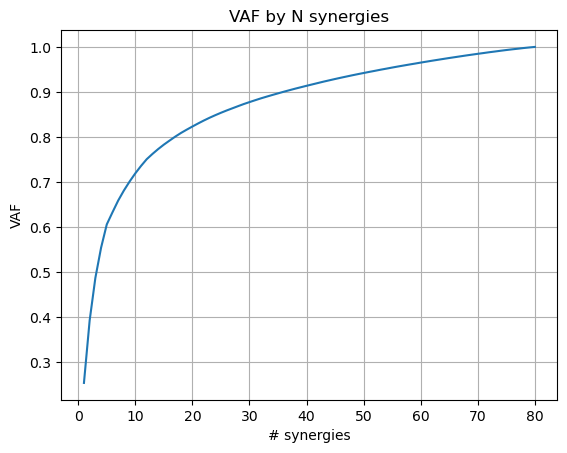

VAF by N synergies: {1: 0.2541, 2: 0.3929, 3: 0.4872, 4: 0.5542, 5: 0.606, 6: 0.6329, 7: 0.659, 8: 0.6813, 9: 0.7012, 10: 0.7194, 11: 0.7358, 12: 0.7508, 13: 0.7624, 14: 0.7732, 15: 0.7831, 16: 0.7921, 17: 0.8009, 18: 0.809, 19: 0.8163, 20: 0.8233, 21: 0.8301, 22: 0.8366, 23: 0.8427, 24: 0.8484, 25: 0.8538, 26: 0.8589, 27: 0.8637, 28: 0.8685, 29: 0.8732, 30: 0.8775, 31: 0.8817, 32: 0.8858, 33: 0.8896, 34: 0.8933, 35: 0.8969, 36: 0.9005, 37: 0.9039, 38: 0.9073, 39: 0.9105, 40: 0.9137, 41: 0.9168, 42: 0.9199, 43: 0.923, 44: 0.9259, 45: 0.9288, 46: 0.9316, 47: 0.9343, 48: 0.937, 49: 0.9396, 50: 0.9421, 51: 0.9446, 52: 0.947, 53: 0.9495, 54: 0.9518, 55: 0.9542, 56: 0.9565, 57: 0.9587, 58: 0.9609, 59: 0.963, 60: 0.9652, 61: 0.9673, 62: 0.9694, 63: 0.9714, 64: 0.9734, 65: 0.9754, 66: 0.9773, 67: 0.9792, 68: 0.9811, 69: 0.9829, 70: 0.9847, 71: 0.9864, 72: 0.9882, 73: 0.9898, 74: 0.9915, 75: 0.9931, 76: 0.9946, 77: 0.996, 78: 0.9975, 79: 0.9988, 80: 1.0}


In [ ]:
syn_dict = find_synergies_vae(muscle_data, plot=True)
print("VAF by N synergies:", syn_dict)

In [ ]:
encoder, decoder, normalizer = compute_VAE_SAR(muscle_data, [20], save=True)

## Option 1.1.B: Use precomputed SAR

In [17]:
ica,pca,normalizer = load_locomotion_SAR()

/opt/miniconda3/lib/python3.12/site-packages/sklearn/base.py:380: InconsistentVersionWarning: Trying to unpickle estimator FastICA from version 1.1.2 when using version 1.6.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/miniconda3/lib/python3.12/site-packages/sklearn/base.py:380: InconsistentVersionWarning: Trying to unpickle estimator PCA from version 1.1.2 when using version 1.6.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/miniconda3/lib/python3.12/site-packages/sklearn/base.py:380: InconsistentVersionWarning: Trying to unpickle estimator MinMaxScaler from version 1.1.2 when using version 1.6.1. This might lead to breaking code or inval

# Step 1.2: Train on unseen terrain with synergies (SAR-RL)

In [ ]:
# randomly choose terrain to learn, or manually choose one
new_terrain = np.random.choice(['Hilly', 'Stair', 'Rough'])
# new_terrain = ...
print(f'myoLeg{new_terrain}TerrainWalk-v0 selected for training.')

myoLegRoughTerrainWalk-v0 selected for training.


In [20]:
SAR_RL(env_name='myoLegWalk-v0', policy_name='SAR-RL', timesteps=2.5e6, 
       seed='0', ica=ica, pca=pca, normalizer=normalizer, phi=.66, syn_nosyn=False)

Using cpu device
Logging to SAR-RL_results_myoLegWalk-v0_0
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 33.2     |
|    ep_rew_mean     | 51.6     |
| time/              |          |
|    episodes        | 4        |
|    fps             | 898      |
|    time_elapsed    | 0        |
|    total_timesteps | 133      |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 33.6     |
|    ep_rew_mean     | 61.3     |
| time/              |          |
|    episodes        | 8        |
|    fps             | 887      |
|    time_elapsed    | 0        |
|    total_timesteps | 269      |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 34.2     |
|    ep_rew_mean     | 59.4     |
| time/              |          |
|    episodes        | 12       |
|    fps             | 892      |
|    time_elapsed    | 

In [ ]:
video_name = 'walk_SAR-RL_video'

get_vid(name='SAR-RL', env_name='myoLegWalk-v0', seed='0', episodes=5, video_name=video_name, 
        determ=False, pca=pca, ica=ica, normalizer=normalizer, phi=.66, is_sar=True, syn_nosyn=False)

show_video(f"{video_name}.mp4")

0it [00:00, ?it/s]/opt/miniconda3/lib/python3.12/site-packages/gymnasium/core.py:311: UserWarning: WARN: env.get_obs to get variables from other wrappers is deprecated and will be removed in v1.0, to get this variable you can do `env.unwrapped.get_obs` for environment variables or `env.get_wrapper_attr('get_obs')` that will search the reminding wrappers.
  logger.warn(
/opt/miniconda3/lib/python3.12/site-packages/gymnasium/core.py:311: UserWarning: WARN: env.sim to get variables from other wrappers is deprecated and will be removed in v1.0, to get this variable you can do `env.unwrapped.sim` for environment variables or `env.get_wrapper_attr('sim')` that will search the reminding wrappers.
  logger.warn(
/opt/miniconda3/lib/python3.12/site-packages/gymnasium/core.py:311: UserWarning: WARN: env.get_obs to get variables from other wrappers is deprecated and will be removed in v1.0, to get this variable you can do `env.unwrapped.get_obs` for environment variables or `env.get_wrapper_attr(

In [ ]:
gym.make('myoLegWalk-v0')

<TimeLimit<OrderEnforcing<PassiveEnvChecker<WalkEnvV0<myoLegWalk-v0>>>>>

# Step 1.3 (optional): Train on unseen terrain with end-to-end RL (RL-E2E)

In [ ]:
train('myoLegWalk-v0', 'RL-E2E', 4e6, '0')

Using cpu device
Logging to RL-E2E_results_myoLegWalk-v0_0
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 36.5     |
|    ep_rew_mean     | 61.8     |
| time/              |          |
|    episodes        | 4        |
|    fps             | 954      |
|    time_elapsed    | 0        |
|    total_timesteps | 146      |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 36.5     |
|    ep_rew_mean     | 56.4     |
| time/              |          |
|    episodes        | 8        |
|    fps             | 978      |
|    time_elapsed    | 0        |
|    total_timesteps | 292      |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 36.5     |
|    ep_rew_mean     | 55.6     |
| time/              |          |
|    episodes        | 12       |
|    fps             | 973      |
|    time_elapsed    | 

# Step 2.4: Plot results

We use linear representations (i.e., PCA, ICA, normalization) to approximate SAR. These representations are based directly on the motor neuroscience literature of representing muscle synergies (c.f., [Tresch et al, 2006](https://journals.physiology.org/doi/epdf/10.1152/jn.00222.2005)). Such representations also have the advantages of being highly interpretable and efficient for use as control signals. We also found in practice that nonlinear representations (such as VAE decoder networks) did not lead to strong performance are were far less efficient for training.

Before computing SAR, we first seek to understand how informative each individual muscle synergy is for explaining the initial muscle activation dataset. `find_synergies` returns a dictionary (and optionally, a plot) that shows variance accounted for (VAF) by N synergies from the original muscle activation data. In general, we find that using a number of synergies where VAF > 80% leads to good performance, though this value should be treated as a hyperparameter.

We use linear representations (i.e., PCA, ICA, normalization) to approximate SAR. These representations are based directly on the motor neuroscience literature of representing muscle synergies (c.f., [Tresch et al, 2006](https://journals.physiology.org/doi/epdf/10.1152/jn.00222.2005)). Such representations also have the advantages of being highly interpretable and efficient for use as control signals. We also found in practice that nonlinear representations (such as VAE decoder networks) did not lead to strong performance are were far less efficient for training.

Before computing SAR, we first seek to understand how informative each individual muscle synergy is for explaining the initial muscle activation dataset. `find_synergies` returns a dictionary (and optionally, a plot) that shows variance accounted for (VAF) by N synergies from the original muscle activation data. In general, we find that using a number of synergies where VAF > 80% leads to good performance, though this value should be treated as a hyperparameter.

For convenience, a function is defined to automatically plot the results of these runs (ensure the names and seeds are preserved).

None


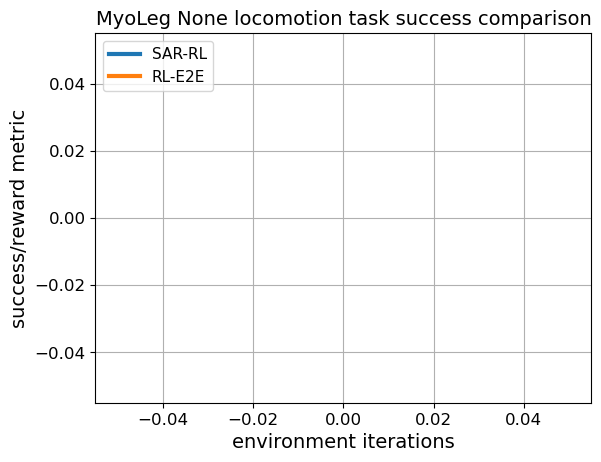

In [13]:
plot_results(experiment='locomotion')

# Full training example 2: SAR x physiological manipulation

Now, we turn to using synergies for manipulation rather than locomotion. In this example:
- a policy is trained on an eight-object reorientation task, `Reorient8-v0`.
- after training, we collect muscle activation data from policy rollouts
- variance accounted for (VAF) by N synergies is computed. Here, we select N where VAF > 0.8.
- SAR is computed at this VAF threshold.
- SAR is used to train on a 100-object reorientation task, `Reorient100-v0`.

<strong>Note: we also provide the option of using pretrained policies/representations at some of the above steps. Run the code below depending on your preferences.</strong>

# Step 2.1

First, we acquire our synergistic action representation. We provide two options for this:

<strong>Option A: Get SAR from scratch (i.e., train on `Reorient8` as play period → get muscle activations → compute SAR).</strong>

<strong>Option B: Use the precomputed SAR.</strong>

## Option 2.1.A: Get SAR from scratch

In [ ]:
# a policy is trained on an eight-object reorientation task, Reorient8-v0
train(env_name='myoHandReorient8-v0', policy_name='play_period', timesteps=1e6, seed='0')

In [ ]:
# after training, we collect muscle activation data from policy rollouts
muscle_data = get_activations(name='play_period', env_name='myoHandReorient8-v0', seed='0', episodes=10)

In [ ]:
# VAF by N synergies is computed. Here, N is selected where VAF > 0.8
syn_dict = find_synergies(muscle_data, plot=True)
print("VAF by N synergies:", syn_dict)

In [ ]:
# make and load a video of the trained policy

video_name = 'play_period_vid'
get_vid(name='play_period', env_name='myoHandReorient8-v0', seed='0', episodes=10, video_name=video_name)
show_video(f"{video_name}.mp4")

In [ ]:
# SAR is computed at this VAF threshold
ica,pca,normalizer = compute_SAR(muscle_data, 20, save=False)

## Option 2.1.B: Use precomputed SAR

In [ ]:
# RUN THIS CELL TO USE PRECOMPUTED SAR
ica,pca,normalizer = load_manipulation_SAR()

# Step 2.2: Train on Reorient100 with synergies (SAR-RL)

In [ ]:
# SAR is used to train on a 100-object reorientation task, Reorient100-v0
SAR_RL(env_name='myoHandReorient100-v0', policy_name='SAR-RL', timesteps=1.5e6, 
       seed='0', ica=ica, pca=pca, normalizer=normalizer, phi=.66)

In [ ]:
# make and load a video of the trained policy

video_name = 'SAR_vid'

get_vid(name='SAR-RL', env_name='myoHandReorient100-v0', seed='0', episodes=10, video_name=video_name, 
        determ=True, pca=pca, ica=ica, normalizer=normalizer, phi=.66, is_sar=True, syn_nosyn=True)
show_video(f"{video_name}.mp4")

# Step 2.3 (optional): Train on Reorient100 with end-to-end RL (RL-E2E)

We can compare the performance of (A) pretraining for 1M steps on `Reorient8-v0`, getting SAR, and training with SAR-RL on `Reorient100-v0` for 2M steps with (B) training for 3M steps using end-to-end RL ('RL-E2E').

In [ ]:
train(env_name='myoHandReorient100-v0', policy_name='RL-E2E', timesteps=2.5e6, seed='0')

In [ ]:
# make and load a video of the trained policy

video_name = 'RL+E2E_vid'
get_vid('RL-E2E', 'myoHandReorient100-v0', '0', determ=False, episodes=10, video_name=video_name)
show_video(f"{video_name}.mp4")

# Step 2.4: Plot results

For convenience, a function is defined to automatically plot the results of these runs (ensure the names and seeds are preserved).

In [ ]:
plot_results(experiment='manipulation')

# Step 2.5 (optional): zero-shot testing manipulation policies on new unseen objects

We can optionally test these manipulation policies on unseen objects to determine their generalizability. Here, we implement two test
environments.

1. ReorientID-v0—1000 unseen objects generated by sampling from the same dimensions as those for the Reorient100-v0 set. Intuitively, this environment contains new objects with the same kind of shapes as those seen in the training set.

2. ReorientOOD-v0—1000 unseen objects generated by sampling from different dimensions as those for the Reorient100-v0 set. Intuitively, this environment contains new objects with different kinds of shapes as those seen in the training set.

In [ ]:
def zeroshot_test(name, test_env_name, env_name='myoHandReorient100-v0', seed='0', determ=True, ica=None, 
                  pca=None, normalizer=None, phi=.66, episodes=500, is_sar=False, syn_nosyn=False):
    """
    Check zero-shot performance of policies on the test environments.
    
    name: str; name of the policy to test
    env_name: str; name of gym env the policy to test was trained on (Reorient100-v0).
    seed: str; seed of the policy to test
    test_env_name: str; name of the desired test env
    ica: if testing SAR-RL, the ICA object
    pca: if testing SAR-RL, the PCA object
    normalizer: if testing SAR-RL, the normalizer object
    phi: float; blend parameter between synergistic and nonsynergistic activations
    episodes: int; number of episodes to run on the test environment
    """
    if is_sar:
        if syn_nosyn:
            env = SynNoSynWrapper(gym.make(test_env_name), ica, pca, normalizer, phi)
        else:
            # env = SynergyWrapper(gym.make(test_env_name), ica, pca, normalizer, phi)
            env = SynergyWrapper(gym.make(test_env_name), ica, pca, normalizer)
    else:
        env = gym.make(test_env_name)
    env.reset()

    model = SAC.load(f'{name}_model_{env_name}_{seed}')
    vec = VecNormalize.load(f'{name}_env_{env_name}_{seed}', DummyVecEnv([lambda: env]))
    solved = []
    for i,_ in enumerate(range(episodes)):
        is_solved = []
        env.reset()
        done = False
        while not done:
            o = env.get_obs()
            o = vec.normalize_obs(o)
            a, __ = model.predict(o, deterministic=determ)
            next_o, r, done, *_, info = env.step(a)
            is_solved.append(info['solved'])
        
        if sum(is_solved) > 0:
            solved.append(1)
        else:
            solved.append(0)

    env.close()
    return np.mean(solved)

In [ ]:
# zero-shot testing RL-E2E policy

name = 'RL-E2E'

e2e_id = zeroshot_test(name, 'myoHandReorientID-v0')

e2e_ood = zeroshot_test(name, 'myoHandReorientOOD-v0')

In [ ]:
# zero-shot testing SAR-RL policy

name = 'SAR-RL'

sar_id = zeroshot_test(name, 'myoHandReorientID-v0', ica=ica, pca=pca, 
                       normalizer=normalizer, is_sar=True, syn_nosyn=True)

sar_ood = zeroshot_test(name, 'myoHandReorientOOD-v0', ica=ica, pca=pca, 
                        normalizer=normalizer, is_sar=True, syn_nosyn=True)

We can visualize these zero-shot generalization results by running the cell below.

In [ ]:
# plot results
    
zeroshot = {"SAR-RL": [sar_id,sar_ood],
            "RL-E2E": [e2e_id,e2e_ood]}

fig, ax = plt.subplots()
plot_zeroshot(ax, zeroshot)
fig.set_size_inches(6, 5)
plt.show()